<span style="background-color:#f6f8fa">last updated : 2023-Mar-13 / Daegun Kim (daegunkim0425@gmail.com)</span>

# EDA_MIMIC
- **Dataset URL:** https://physionet.org/content/mimiciv/2.2/
- This notebook is written based on MIMIC v2.0.0

> ### Table of contents
> 0. [Merge CSV files](#0-merge-csv-files)
> 1. [Explore CSV files](#1-explore-csv-files)
> 2. [Explore Images](#2-explore-images)

In [1]:
import os
import pandas as pd
from glob import glob
import seaborn as sns
from copy import deepcopy
import math
import random

from PIL import Image
import numpy as np
from matplotlib import pyplot as plt

In [2]:
import warnings
warnings.filterwarnings("ignore")

# 0. Merge CSV files

There are four CSV files in MIMIC dataset
* Two csv files containing target information by different labeling algorithm
  - chexpert.csv
  - negbio.csv
* A csv file containing meta-data such as original image size, date, etc
  - metadata.csv
* A csv file contatining data split information
  - split.csv

To get image and target information from a single csv file, they should be merged in a right way <br>
For the purpose, the product of study_id and subject_id looks adequate for the primary key <br>
However, since the symmetric difference between metadata(or split) and mimic_chexpert (or mimic_negbio), it should be merged carefully <br>
I merged three files (meta + pathological label + split) into one refered to the How_to_Load_MIMIC.ipynb in the tutorials directory

In [3]:
root_dir = '/home/mimic-cxr-jpg/2.0.0/'
chexpert_org_df = pd.read_csv(os.path.join(root_dir, 'mimic-cxr-2.0.0-chexpert.csv'))
metadata_df = pd.read_csv(os.path.join(root_dir, 'mimic-cxr-2.0.0-metadata.csv'))
negbio_org_df = pd.read_csv(os.path.join(root_dir, 'mimic-cxr-2.0.0-negbio.csv'))
split_df = pd.read_csv(os.path.join(root_dir, 'mimic-cxr-2.0.0-split.csv'))

In [4]:
chexpert_org_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227827 entries, 0 to 227826
Data columns (total 16 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   subject_id                  227827 non-null  int64  
 1   study_id                    227827 non-null  int64  
 2   Atelectasis                 57666 non-null   float64
 3   Cardiomegaly                66799 non-null   float64
 4   Consolidation               23076 non-null   float64
 5   Edema                       65833 non-null   float64
 6   Enlarged Cardiomediastinum  21837 non-null   float64
 7   Fracture                    5831 non-null    float64
 8   Lung Lesion                 8287 non-null    float64
 9   Lung Opacity                58425 non-null   float64
 10  No Finding                  75455 non-null   float64
 11  Pleural Effusion            87272 non-null   float64
 12  Pleural Other               2902 non-null    float64
 13  Pneumonia     

In [5]:
chexpert_org_df.head(1)

,subject_id,study_id,Atelectasis,Cardiomegaly,Consolidation,Edema,Enlarged Cardiomediastinum,Fracture,Lung Lesion,Lung Opacity,No Finding,Pleural Effusion,Pleural Other,Pneumonia,Pneumothorax,Support Devices
0,10000032,50414267,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [6]:
negbio_org_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227827 entries, 0 to 227826
Data columns (total 16 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   subject_id                  227827 non-null  int64  
 1   study_id                    227827 non-null  int64  
 2   Atelectasis                 57666 non-null   float64
 3   Cardiomegaly                66760 non-null   float64
 4   Consolidation               23076 non-null   float64
 5   Edema                       65833 non-null   float64
 6   Enlarged Cardiomediastinum  21807 non-null   float64
 7   Fracture                    5831 non-null    float64
 8   Lung Lesion                 8287 non-null    float64
 9   Lung Opacity                58425 non-null   float64
 10  No Finding                  78777 non-null   float64
 11  Pleural Effusion            87272 non-null   float64
 12  Pleural Other               2902 non-null    float64
 13  Pneumonia     

In [7]:
negbio_org_df.head(1)

,subject_id,study_id,Atelectasis,Cardiomegaly,Consolidation,Edema,Enlarged Cardiomediastinum,Fracture,Lung Lesion,Lung Opacity,No Finding,Pleural Effusion,Pleural Other,Pneumonia,Pneumothorax,Support Devices
0,10000032,50414267,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [8]:
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377110 entries, 0 to 377109
Data columns (total 12 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   dicom_id                                    377110 non-null  object 
 1   subject_id                                  377110 non-null  int64  
 2   study_id                                    377110 non-null  int64  
 3   PerformedProcedureStepDescription           341598 non-null  object 
 4   ViewPosition                                361341 non-null  object 
 5   Rows                                        377110 non-null  int64  
 6   Columns                                     377110 non-null  int64  
 7   StudyDate                                   377110 non-null  int64  
 8   StudyTime                                   377110 non-null  float64
 9   ProcedureCodeSequence_CodeMeaning           377110 non-null  object 
 

In [9]:
metadata_df.head(1)

,dicom_id,subject_id,study_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,ViewCodeSequence_CodeMeaning,PatientOrientationCodeSequence_CodeMeaning
0,02aa804e-bde0afdd-112c0b34-7bc16630-4e384014,10000032,50414267,CHEST (PA AND LAT),PA,3056,2544,21800506,213014.531,CHEST (PA AND LAT),postero-anterior,Erect


In [10]:
split_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377110 entries, 0 to 377109
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   dicom_id    377110 non-null  object
 1   study_id    377110 non-null  int64 
 2   subject_id  377110 non-null  int64 
 3   split       377110 non-null  object
dtypes: int64(2), object(2)
memory usage: 11.5+ MB


In [11]:
split_df.head(1)

,dicom_id,study_id,subject_id,split
0,02aa804e-bde0afdd-112c0b34-7bc16630-4e384014,50414267,10000032,train


In [12]:
def merge_three_csv(metadata_df, split_df, target_label_df):
    return pd.merge(
        pd.merge(metadata_df, split_df, left_on=['dicom_id', 'study_id', 'subject_id'], right_on=['dicom_id', 'study_id', 'subject_id'], how='inner'),
        target_label_df, 
        left_on=['study_id', 'subject_id'], right_on=['study_id', 'subject_id'],
        how='right', # This is important due to the symmetric difference between metadata(or split) and mimic_chexpert
        )

chexpert_df = merge_three_csv(metadata_df=metadata_df, split_df=split_df, target_label_df=chexpert_org_df)
negbio_df = merge_three_csv(metadata_df=metadata_df, split_df=split_df, target_label_df=negbio_org_df)

In [13]:
chexpert_df.columns

Index(['dicom_id', 'subject_id', 'study_id',
       'PerformedProcedureStepDescription', 'ViewPosition', 'Rows', 'Columns',
       'StudyDate', 'StudyTime', 'ProcedureCodeSequence_CodeMeaning',
       'ViewCodeSequence_CodeMeaning',
       'PatientOrientationCodeSequence_CodeMeaning', 'split', 'Atelectasis',
       'Cardiomegaly', 'Consolidation', 'Edema', 'Enlarged Cardiomediastinum',
       'Fracture', 'Lung Lesion', 'Lung Opacity', 'No Finding',
       'Pleural Effusion', 'Pleural Other', 'Pneumonia', 'Pneumothorax',
       'Support Devices'],
      dtype='object')

In [14]:
negbio_df.columns

Index(['dicom_id', 'subject_id', 'study_id',
       'PerformedProcedureStepDescription', 'ViewPosition', 'Rows', 'Columns',
       'StudyDate', 'StudyTime', 'ProcedureCodeSequence_CodeMeaning',
       'ViewCodeSequence_CodeMeaning',
       'PatientOrientationCodeSequence_CodeMeaning', 'split', 'Atelectasis',
       'Cardiomegaly', 'Consolidation', 'Edema', 'Enlarged Cardiomediastinum',
       'Fracture', 'Lung Lesion', 'Lung Opacity', 'No Finding',
       'Pleural Effusion', 'Pleural Other', 'Pneumonia', 'Pneumothorax',
       'Support Devices'],
      dtype='object')

##### Key observations
* There is no column about non-pathological patients' information such as age, sex. It is different from CheXpert or BRAX datasets

# 1. Explore CSV files

## 1.1 Split csv

In [15]:
chexpert_train_df = chexpert_df[chexpert_df.split=='train']
chexpert_valid_df = chexpert_df[chexpert_df.split=='validate']
chexpert_test_df = chexpert_df[chexpert_df.split=='test']
negbio_train_df = negbio_df[negbio_df.split=='train']
negbio_valid_df = negbio_df[negbio_df.split=='validate']
negbio_test_df = negbio_df[negbio_df.split=='test']

In [16]:
chexpert_df.split.value_counts()

train       368945
test          5159
validate      2991
Name: split, dtype: int64

##### Key observations
* The train set has much more samples than validation and test set (around 123 times (72 times) bigger than validation (test) )
* Test set is around 1.7 times bigger than validation set

## 1.2 Check missing values

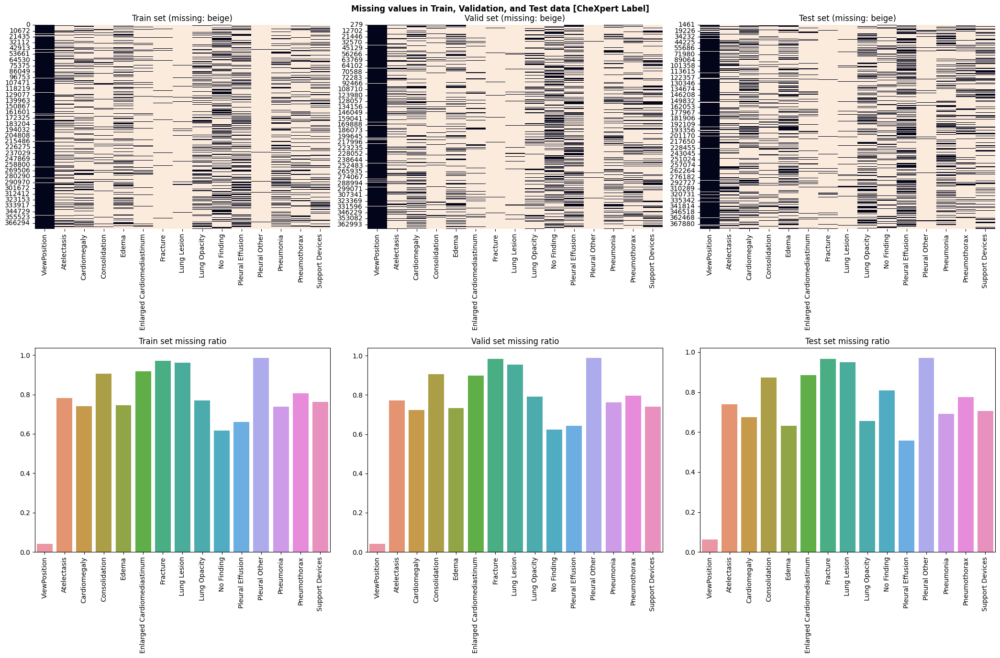

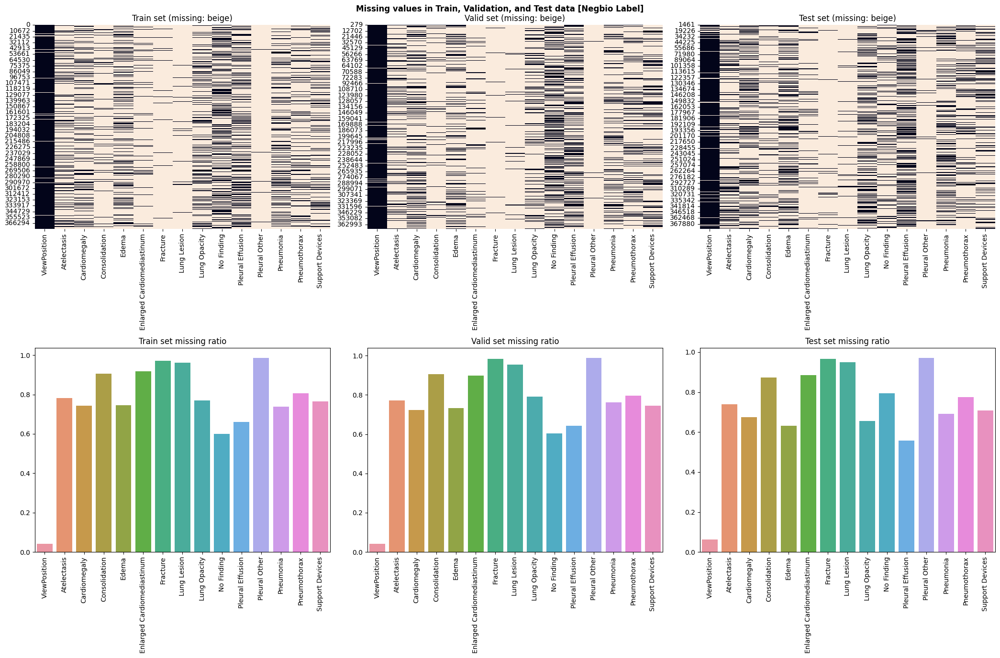

In [17]:
focus_cols = ['ViewPosition', 'Atelectasis',
       'Cardiomegaly', 'Consolidation', 'Edema', 'Enlarged Cardiomediastinum',
       'Fracture', 'Lung Lesion', 'Lung Opacity', 'No Finding',
       'Pleural Effusion', 'Pleural Other', 'Pneumonia', 'Pneumothorax',
       'Support Devices']

# Chexpert
fig_ms_heat, ax_ms_heat = plt.subplots(2, 3, figsize=(21, 14))

sns.heatmap(chexpert_train_df[focus_cols].isnull(), cbar=False, square=False, ax=ax_ms_heat[0][0])
sns.heatmap(chexpert_valid_df[focus_cols].isnull(), cbar=False, square=False, ax=ax_ms_heat[0][1])
sns.heatmap(chexpert_test_df[focus_cols].isnull(), cbar=False, square=False, ax=ax_ms_heat[0][2])

ax4 = sns.barplot(chexpert_train_df[focus_cols].isnull(), ax=ax_ms_heat[1][0], errorbar=None)
ax5 = sns.barplot(chexpert_valid_df[focus_cols].isnull(), ax=ax_ms_heat[1][1], errorbar=None)
ax6 = sns.barplot(chexpert_test_df[focus_cols].isnull(), ax=ax_ms_heat[1][2], errorbar=None)
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=90)
ax5.set_xticklabels(ax5.get_xticklabels(), rotation=90)
ax6.set_xticklabels(ax6.get_xticklabels(), rotation=90)

ax_ms_heat[0][0].set_title('Train set (missing: beige)')
ax_ms_heat[0][1].set_title('Valid set (missing: beige)')
ax_ms_heat[0][2].set_title('Test set (missing: beige)')
ax_ms_heat[1][0].set_title('Train set missing ratio')
ax_ms_heat[1][1].set_title('Valid set missing ratio')
ax_ms_heat[1][2].set_title('Test set missing ratio')

fig_ms_heat.suptitle('Missing values in Train, Validation, and Test data [CheXpert Label]', weight='bold')
fig_ms_heat.tight_layout()

# Negbio
fig_ms_heat, ax_ms_heat = plt.subplots(2, 3, figsize=(21, 14))

sns.heatmap(negbio_train_df[focus_cols].isnull(), cbar=False, square=False, ax=ax_ms_heat[0][0])
sns.heatmap(negbio_valid_df[focus_cols].isnull(), cbar=False, square=False, ax=ax_ms_heat[0][1])
sns.heatmap(negbio_test_df[focus_cols].isnull(), cbar=False, square=False, ax=ax_ms_heat[0][2])

ax4 = sns.barplot(negbio_train_df[focus_cols].isnull(), ax=ax_ms_heat[1][0], errorbar=None)
ax5 = sns.barplot(negbio_valid_df[focus_cols].isnull(), ax=ax_ms_heat[1][1], errorbar=None)
ax6 = sns.barplot(negbio_test_df[focus_cols].isnull(), ax=ax_ms_heat[1][2], errorbar=None)
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=90)
ax5.set_xticklabels(ax5.get_xticklabels(), rotation=90)
ax6.set_xticklabels(ax6.get_xticklabels(), rotation=90)

ax_ms_heat[0][0].set_title('Train set (missing: beige)')
ax_ms_heat[0][1].set_title('Valid set (missing: beige)')
ax_ms_heat[0][2].set_title('Test set (missing: beige)')
ax_ms_heat[1][0].set_title('Train set missing ratio')
ax_ms_heat[1][1].set_title('Valid set missing ratio')
ax_ms_heat[1][2].set_title('Test set missing ratio')

fig_ms_heat.suptitle('Missing values in Train, Validation, and Test data [Negbio Label]', weight='bold')
fig_ms_heat.tight_layout()

##### Key observations
* **Validation and test set have missing values**
  - It is positive in terms of similarity between train, validation, and test but proper preprocessing should be adapted
* More than half of every pathological column is missing, thus the preprocessing of missing values might have quite an impact
  - Few target columns such as Pleural Other, Fracture show extremely high ratio of missing values
* There are missing values in the view position but the amount is small
* In terms of missing ratio by each column, the train, validation, and test dataset show similar distribution (for both chexpert and negbio labeler)
    - Also, the distributions of chexpert and negbio labeler look similar

## 1.3 Visualize Target class distribution labels in each dataset

In [18]:
target_cols = ['No Finding',
       'Enlarged Cardiomediastinum', 'Cardiomegaly', 'Lung Opacity',
       'Lung Lesion', 'Edema', 'Consolidation', 'Pneumonia', 'Atelectasis',
       'Pneumothorax', 'Pleural Effusion', 'Pleural Other', 'Fracture',
       'Support Devices']

pathology_cols = [v for v in target_cols if v not in ['No Finding', 'Support Devices']]

def calculate_label(df: pd.DataFrame, ratio=False, include_nan=True):
    series_nan = df.isnull().sum()
    series_neg_1 = df[df==-1].count()
    series_0 = df[df==0].count()
    series_1 = df[df==1].count()
    if include_nan:
        new_df = pd.concat([series_nan, series_neg_1, series_0, series_1], axis=1)
        new_df.columns=['Nan', '-1', '0', '1']
    else:
        new_df = pd.concat([series_neg_1, series_0, series_1], axis=1)
        new_df.columns=['-1', '0', '1']

    if ratio:
        new_df /= len(df)

    # drop if no value in column
    new_df.drop(columns=new_df.columns[new_df.sum()==0], inplace=True)

    return new_df

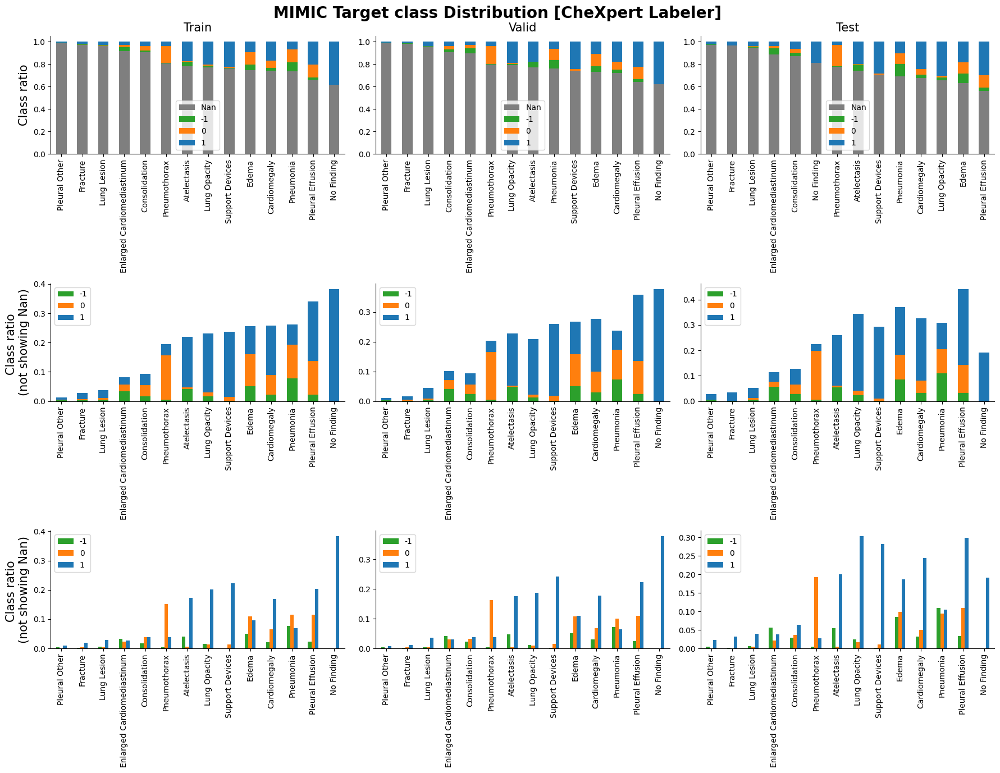

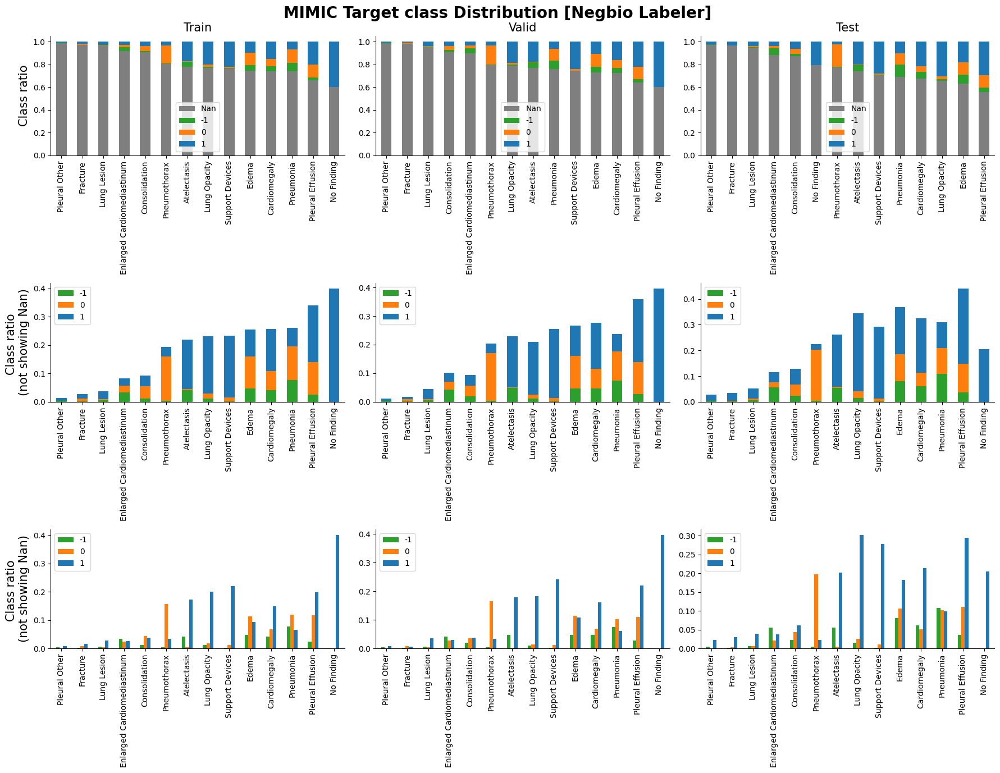

In [19]:
def class_split_plot(train_df, valid_df, test_df, title=None, figsize=(18, 14)):
    fig_lb_viz, ax_lb_viz = plt.subplots(3, 3, figsize=figsize)

    calculate_label(train_df[target_cols], ratio=True, include_nan=True).sort_values('Nan', ascending=False).plot(
        kind='bar', stacked=True, ax=ax_lb_viz[0][0], color=['tab:gray','tab:green','tab:orange','tab:blue'])
    order_by_nan_ratio = calculate_label(train_df[target_cols], ratio=True, include_nan=True).sort_values('Nan', ascending=False).index
    calculate_label(train_df[target_cols], ratio=True, include_nan=False).loc[order_by_nan_ratio, :].plot(
        kind='bar', stacked=True, ax=ax_lb_viz[1][0], color=['tab:green','tab:orange','tab:blue'])
    calculate_label(train_df[target_cols], ratio=True, include_nan=False).loc[order_by_nan_ratio, :].plot(
        kind='bar', stacked=False, ax=ax_lb_viz[2][0], color=['tab:green','tab:orange','tab:blue'])

    calculate_label(valid_df[target_cols], ratio=True, include_nan=True).sort_values('Nan', ascending=False).plot(
        kind='bar', stacked=True, ax=ax_lb_viz[0][1], color=['tab:gray','tab:green','tab:orange','tab:blue'])
    # order_by_nan_ratio = calculate_label(valid_df[target_cols], ratio=True, include_nan=True).sort_values('Nan', ascending=False).index
    calculate_label(valid_df[target_cols], ratio=True, include_nan=False).loc[order_by_nan_ratio, :].plot(
        kind='bar', stacked=True, ax=ax_lb_viz[1][1], color=['tab:green','tab:orange','tab:blue'])
    calculate_label(valid_df[target_cols], ratio=True, include_nan=False).loc[order_by_nan_ratio, :].plot(
        kind='bar', stacked=False, ax=ax_lb_viz[2][1], color=['tab:green','tab:orange','tab:blue'])

    calculate_label(test_df[target_cols], ratio=True, include_nan=True).sort_values('Nan', ascending=False).plot(
        kind='bar', stacked=True, ax=ax_lb_viz[0][2], color=['tab:gray','tab:green','tab:orange','tab:blue'])
    # order_by_nan_ratio = calculate_label(test_df[target_cols], ratio=True, include_nan=True).sort_values('Nan', ascending=False).index
    calculate_label(test_df[target_cols], ratio=True, include_nan=False).loc[order_by_nan_ratio, :].plot(
        kind='bar', stacked=True, ax=ax_lb_viz[1][2], color=['tab:green','tab:orange','tab:blue'])
    calculate_label(test_df[target_cols], ratio=True, include_nan=False).loc[order_by_nan_ratio, :].plot(
        kind='bar', stacked=False, ax=ax_lb_viz[2][2], color=['tab:green','tab:orange','tab:blue'])

    ax_lb_viz[0][0].set_title('Train', fontsize=15)
    ax_lb_viz[0][1].set_title('Valid', fontsize=15)
    ax_lb_viz[0][2].set_title('Test', fontsize=15)

    ax_lb_viz[0][0].set_ylabel('Class ratio', fontsize=15)
    ax_lb_viz[1][0].set_ylabel('Class ratio \n(not showing Nan)', fontsize=15)
    ax_lb_viz[2][0].set_ylabel('Class ratio \n(not showing Nan)', fontsize=15)

    for i in ax_lb_viz:
        for ax in i:
            ax.spines.right.set_visible(False)
            ax.spines.top.set_visible(False)

    fig_lb_viz.suptitle(title, fontsize=20, fontweight='bold')
    fig_lb_viz.tight_layout()

class_split_plot(chexpert_train_df, chexpert_valid_df, chexpert_test_df, title='MIMIC Target class Distribution [CheXpert Labeler]')
class_split_plot(negbio_train_df, negbio_valid_df, negbio_test_df, title='MIMIC Target class Distribution [Negbio Labeler]')

##### Key observations
* The ratio between classes -1, 0, and 1 is a lot different in each target column. For example, the Support Devices is dominated by the positive class (when ignoring nan) but the negative class dominates Pneumothorax
* However, these distributions are similer between train, validation, and test. For example, The negative class is the major class (when ignoring nan) for train, validation, and test
* The uncertain class (-1) is small enough to ignore in some target columns such as Pneumothorax. In contrast, some target columns, for example the Enlarged Cardiomediastinum, has a substantial amount of the uncertain class

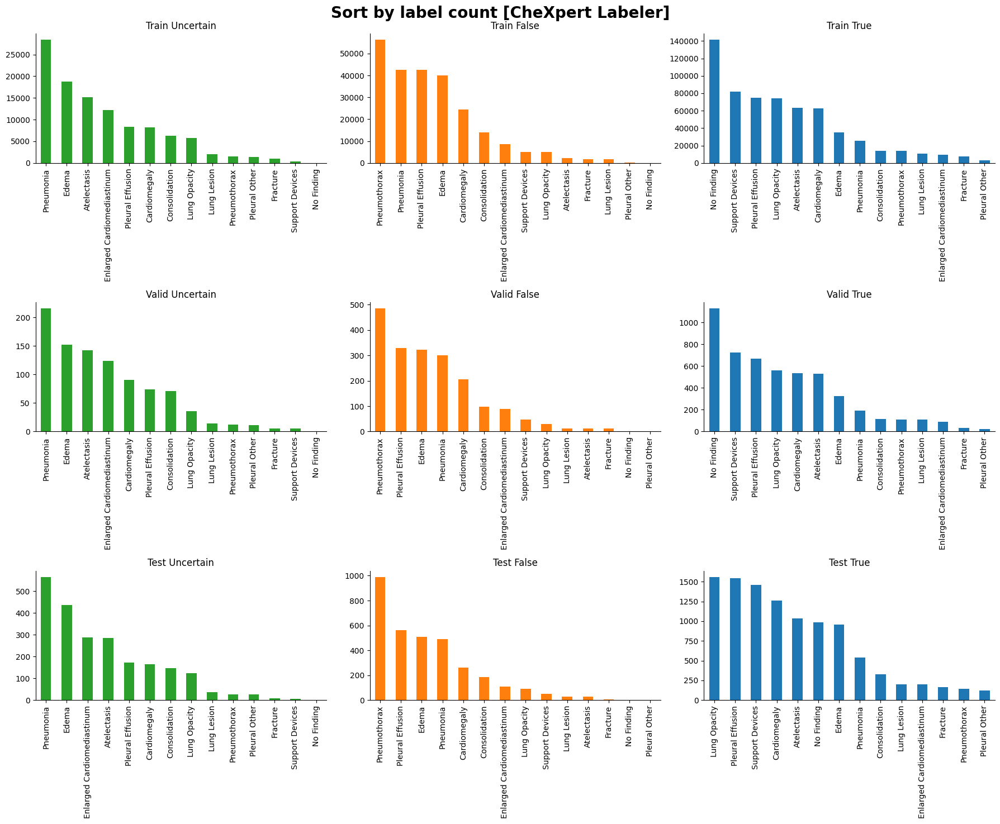

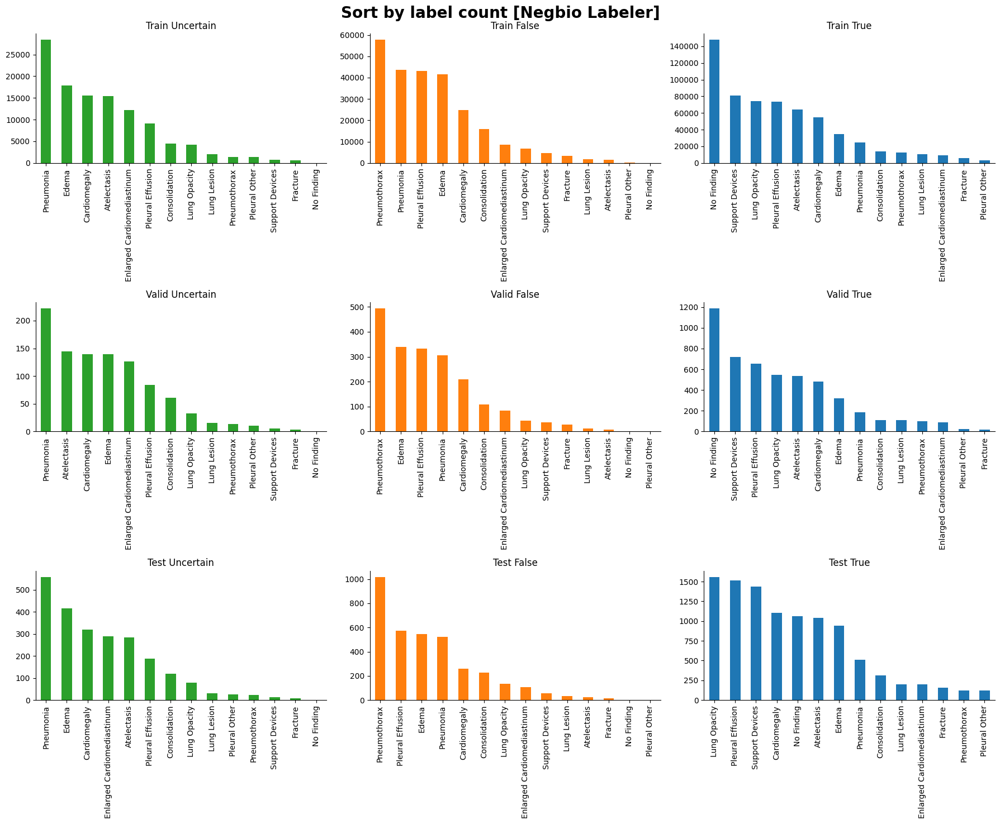

In [20]:
def sort_by_count_plot(train_df, valid_df, test_df, title=None, figsize=(18, 15)):
    fig_val_sort, ax_val_sort = plt.subplots(3, 3, figsize=figsize)

    calculate_label(train_df[target_cols], ratio=False, include_nan=False)['-1'].sort_values(ascending=False).plot(
        kind='bar', ax=ax_val_sort[0][0], title='Train Uncertain', color='tab:green')
    calculate_label(train_df[target_cols], ratio=False, include_nan=False)['0'].sort_values(ascending=False).plot(
        kind='bar', ax=ax_val_sort[0][1], color='tab:orange', title='Train False')
    calculate_label(train_df[target_cols], ratio=False, include_nan=False)['1'].sort_values(ascending=False).plot(
        kind='bar', ax=ax_val_sort[0][2], color='tab:blue', title='Train True')

    calculate_label(valid_df[target_cols], ratio=False, include_nan=False)['-1'].sort_values(ascending=False).plot(
        kind='bar', ax=ax_val_sort[1][0], title='Valid Uncertain', color='tab:green')
    calculate_label(valid_df[target_cols], ratio=False, include_nan=False)['0'].sort_values(ascending=False).plot(
        kind='bar', ax=ax_val_sort[1][1], color='tab:orange', title='Valid False')
    calculate_label(valid_df[target_cols], ratio=False, include_nan=False)['1'].sort_values(ascending=False).plot(
        kind='bar', ax=ax_val_sort[1][2], color='tab:blue', title='Valid True')

    calculate_label(test_df[target_cols], ratio=False, include_nan=False)['-1'].sort_values(ascending=False).plot(
        kind='bar', ax=ax_val_sort[2][0], title='Test Uncertain', color='tab:green')
    calculate_label(test_df[target_cols], ratio=False, include_nan=False)['0'].sort_values(ascending=False).plot(
        kind='bar', ax=ax_val_sort[2][1], color='tab:orange', title='Test False')
    calculate_label(test_df[target_cols], ratio=False, include_nan=False)['1'].sort_values(ascending=False).plot(
        kind='bar', ax=ax_val_sort[2][2], color='tab:blue', title='Test True')
    
    ax_val_sort = ax_val_sort.flatten()
    for ax in ax_val_sort:
        ax.spines.top.set_visible(False)
        ax.spines.right.set_visible(False)

    fig_val_sort.suptitle(title, fontsize=20, fontweight='bold')
    fig_val_sort.tight_layout()

sort_by_count_plot(chexpert_train_df, chexpert_valid_df, chexpert_test_df, title='Sort by label count [CheXpert Labeler]')
sort_by_count_plot(negbio_train_df, negbio_valid_df, negbio_test_df, title='Sort by label count [Negbio Labeler]')

## 1.4 Target balance in terms of the view position

Since view position information is included in the image itself, the model can access the Frontal/Lateral information without explict tabular shaped Frontal/Lateral data. <br>Thus, Frontal/Lateral is qualitatively different from image meta data such as age, sex, and etc

In [21]:
vp_w_missing = chexpert_df['ViewPosition'].fillna('MISSING').value_counts()
pd.concat([
    pd.Series(vp_w_missing, name='count'), 
    pd.Series(vp_w_missing/vp_w_missing.sum(), name='ratio')], axis=1)

,count,ratio
AP,147169,0.390270
PA,96155,0.254989
LATERAL,82852,0.219711
LL,35129,0.093157
MISSING,15769,0.041817
PA LLD,4,0.000011
LAO,3,0.000008
RAO,3,0.000008
AP AXIAL,2,0.000005
AP LLD,2,0.000005


### 1.4.1 Distribution of the view position

To make the scope simple before analysis, let's map the class into Frontal, Lateral. <br>
The missing value was ignored in the mapping process as it only takes less than 5% of the total. <br>
The classes with negligible sample size such as PA LLD, LAO, and etc will also ignored in mapping process because of the same reason.<br>
*The CheXpert and Negbio labeler shares the view position information.

In [22]:
map_ViewPosition = {
    'AP' : 'FRONTAL',
    'PA' : 'FRONTAL',
    'LATERAL' : 'LATERAL',
    'LL' : 'LATERAL'
}

dfs = [chexpert_train_df, chexpert_valid_df, chexpert_test_df, negbio_train_df, negbio_valid_df, negbio_test_df]

for df_nm, df in zip(['CheXpert Train', 'CheXpert Valid', 'CheXpert test', 'Negbio Train', 'Negbio Valid', 'Negbio test'], dfs):
    df['Frontal/Lateral'] = df['ViewPosition'].map(map_ViewPosition)
    _FL = df['Frontal/Lateral'].value_counts()
    print(df_nm)
    print(pd.concat([_FL, pd.Series(_FL/_FL.sum(), name='ratio')], axis=1), '\n')

chexpert_df['Frontal/Lateral'] = chexpert_df['ViewPosition'].map(map_ViewPosition)
negbio_df['Frontal/Lateral'] = negbio_df['ViewPosition'].map(map_ViewPosition)

CheXpert Train
         Frontal/Lateral     ratio
FRONTAL           237962  0.672962
LATERAL           115642  0.327038 

CheXpert Valid
         Frontal/Lateral     ratio
FRONTAL             1959  0.683293
LATERAL              908  0.316707 

CheXpert test
         Frontal/Lateral     ratio
FRONTAL             3403  0.703972
LATERAL             1431  0.296028 

Negbio Train
         Frontal/Lateral     ratio
FRONTAL           237962  0.672962
LATERAL           115642  0.327038 

Negbio Valid
         Frontal/Lateral     ratio
FRONTAL             1959  0.683293
LATERAL              908  0.316707 

Negbio test
         Frontal/Lateral     ratio
FRONTAL             3403  0.703972
LATERAL             1431  0.296028 



##### Key observations
* All of train, validation, and test dataset shows similar ratio between frontal and lateral view position
* The ratio between frontal and lateral is around 7 : 3

### 1.4.2 Relataion between view position and target class distribution

The chi-square test of independence was considered as a method to verify the relation between the view position and target classes. <br>However, due to the high sensitivity of the chi-square test when the sample size is very large, the statistical test became out of consideration.

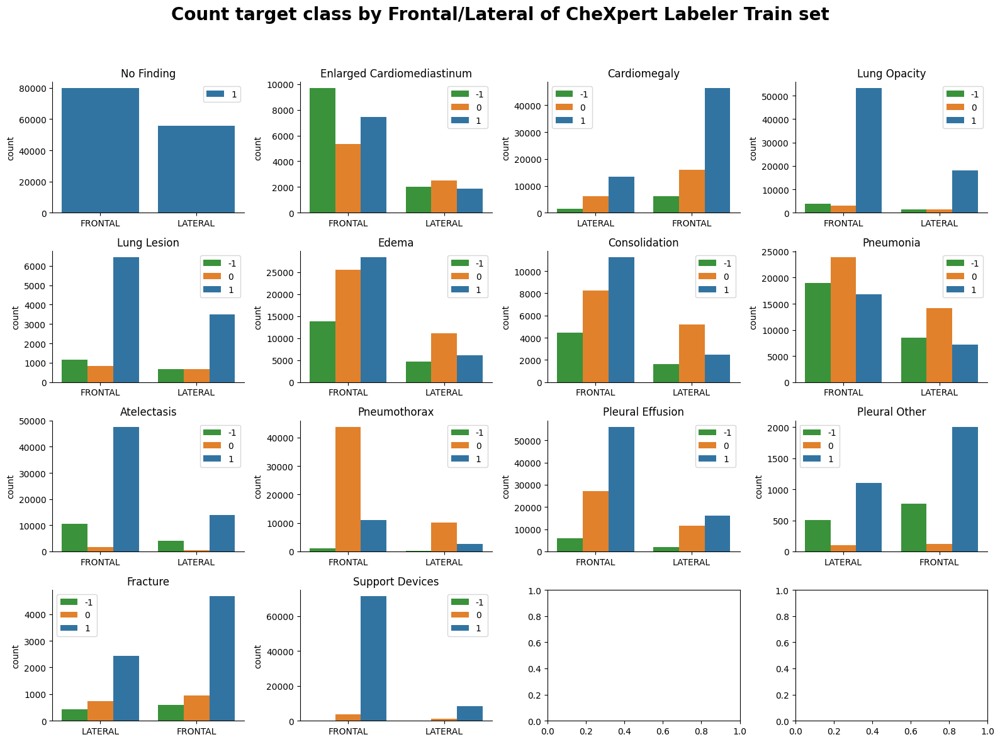

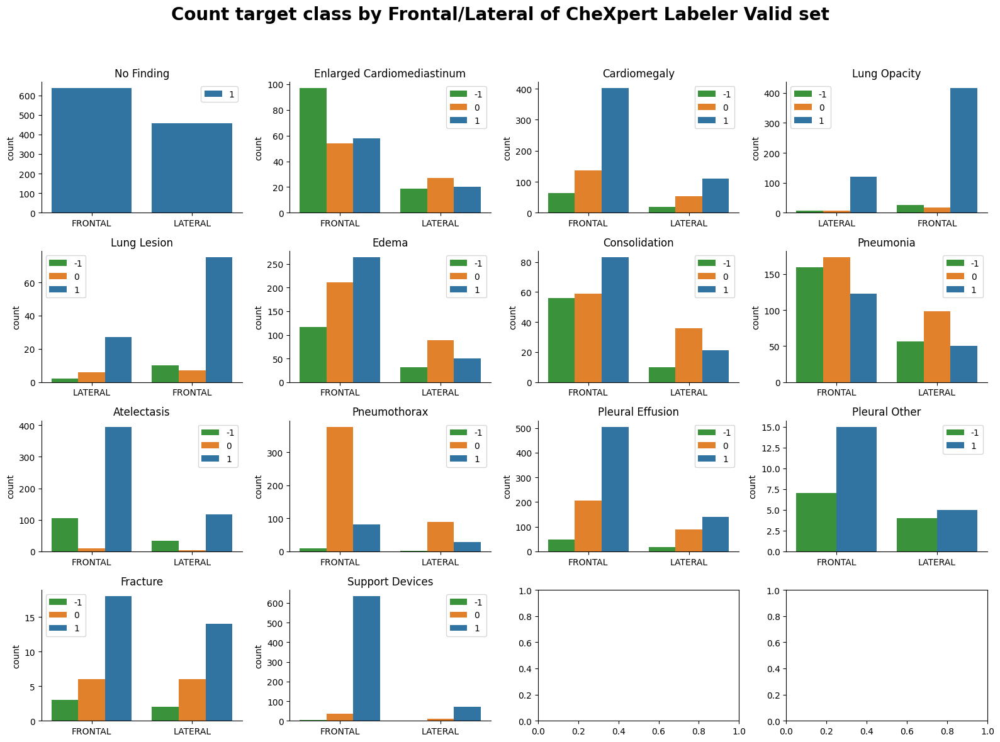

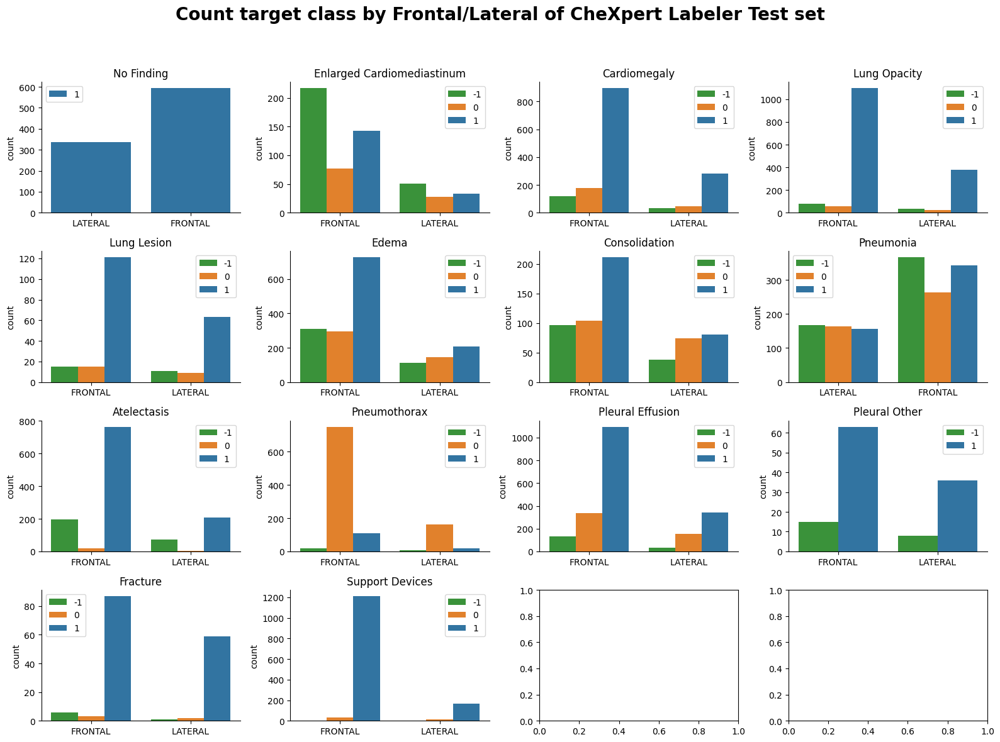

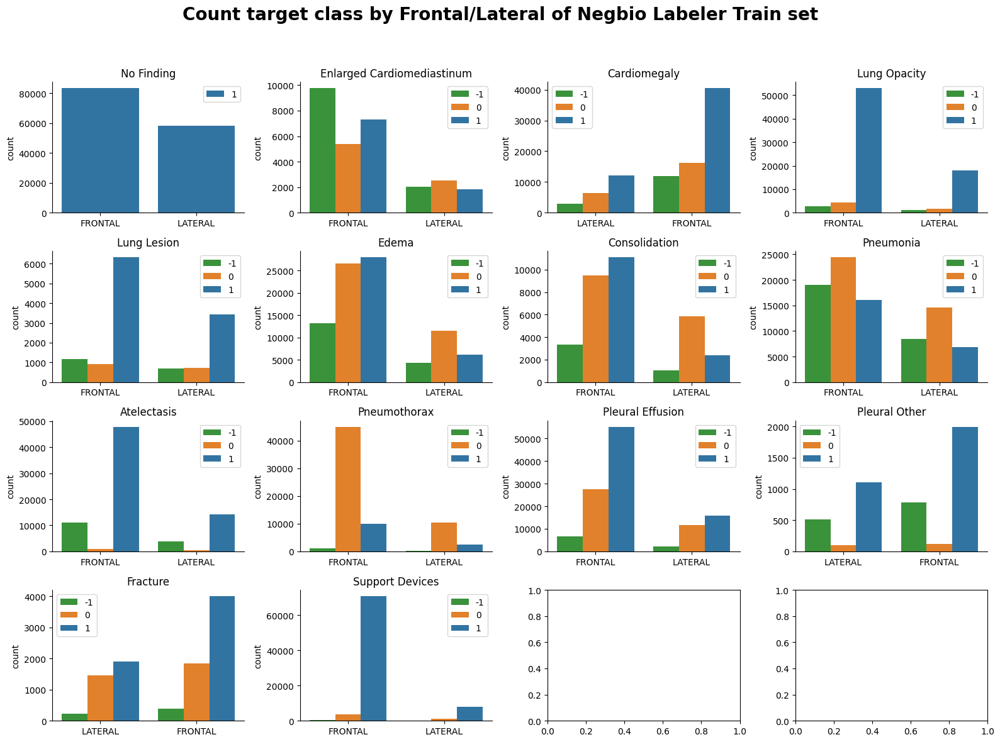

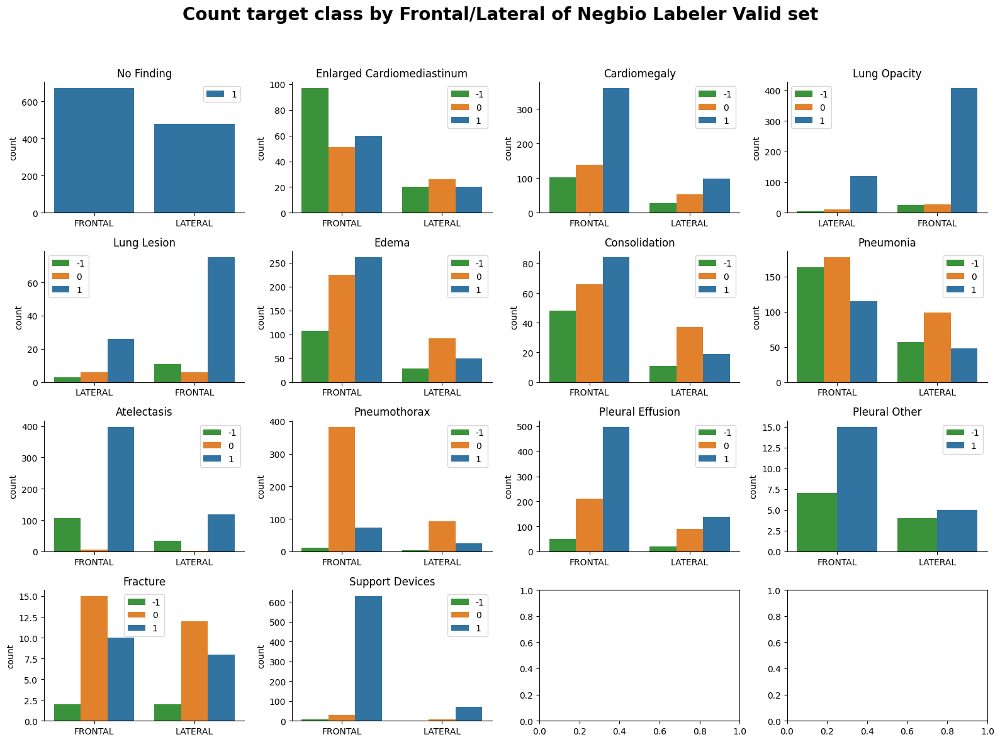

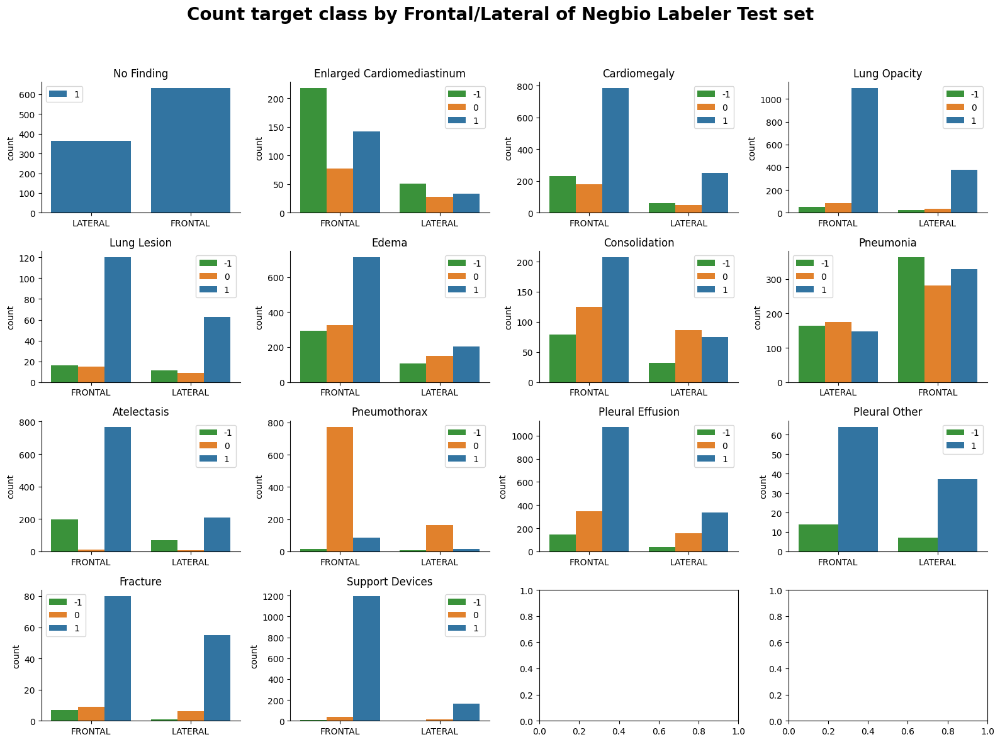

In [23]:
from math import isnan

def plot_relation_view_target(df, title=None):
    fig_rel_view_tgt, ax_rel_view_tgt = plt.subplots(4, 4, figsize=(16, 12))

    ax_rel_view_tgt = ax_rel_view_tgt.flatten()

    for idx, col in enumerate(target_cols):
        if len(df[col].value_counts()) == 1:
            palette = ['tab:blue']
        elif len(df[col].value_counts()) == 2:
            palette = ['tab:green', 'tab:blue']
        else:
            palette=['tab:green', 'tab:orange', 'tab:blue']
        _df = df.copy()
        _df = _df.dropna(subset=col)
        _df[col] = _df[col].astype(int)
        sns.countplot(_df, x='Frontal/Lateral', hue=col, ax=ax_rel_view_tgt[idx], palette=palette)
        ax_rel_view_tgt[idx].legend_.set_title(None)
        ax_rel_view_tgt[idx].spines.top.set_visible(False)
        ax_rel_view_tgt[idx].spines.right.set_visible(False)
        ax_rel_view_tgt[idx].set_xlabel('')
        ax_rel_view_tgt[idx].set_title(col)

    fig_rel_view_tgt.suptitle(title, fontsize=20, fontweight='bold')
    fig_rel_view_tgt.tight_layout()

dfs = [chexpert_train_df, chexpert_valid_df, chexpert_test_df, negbio_train_df, negbio_valid_df, negbio_test_df]
titles = [
    'Count target class by Frontal/Lateral of CheXpert Labeler Train set\n\n',
    'Count target class by Frontal/Lateral of CheXpert Labeler Valid set\n\n',
    'Count target class by Frontal/Lateral of CheXpert Labeler Test set\n\n',
    'Count target class by Frontal/Lateral of Negbio Labeler Train set\n\n',
    'Count target class by Frontal/Lateral of Negbio Labeler Valid set\n\n',
    'Count target class by Frontal/Lateral of Negbio Labeler Test set\n\n',
]

for df, title in zip(dfs, titles):
    plot_relation_view_target(df, title)

##### Key observations
* A few targets show different distributions of classes (-1, 0, 1) by view position (in other words, target and view position might not be independent)
  - For example, the enlarged cardiomediastinum uncertain class (-1) is the most frequent class for the Frontal view (for both train & validation and chexpert & negbio also) but the negative class is the most frequent class for the Lateral view.
* The difference in distribution by view position is not same for all train, valid, and test
  - For example, the enlarged cardiomediastinum positive class (1) is the most frequent class for both the Frontal and Lateral view position (for both chexpert & negbio)
* The pleural other show quite different class distribution depending on view position and data split
  - There is negative class (0) in train dataset but not in valid and test (for both chexpert & negbio) 
  - The positive class (1) is not dominant in the lateral view validation dataset but is dominant in the lateral view test (for both chexpert & negbio)
* Some targets show clues for the relation between class distribution and view position or data split but it is not guaranteed by numerical calculation or statistical test. Also, these differences in distribution are relatively minor among target classes

# 2. Explore Images

It is difficult to get valuable medical information from Chest X-ray images unless sufficient education and training are conducted.

Nevertheless, viewing images directly is still a good way to understand data because it helps to
* Guess model input
* Check whether the metadata matches the real images
* Check whether there is and how much noise in images

### 2.1 Image random sampling by each dataset

In [24]:
chexpert_df.head(1)

,dicom_id,subject_id,study_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,...,Fracture,Lung Lesion,Lung Opacity,No Finding,Pleural Effusion,Pleural Other,Pneumonia,Pneumothorax,Support Devices,Frontal/Lateral
0,02aa804e-bde0afdd-112c0b34-7bc16630-4e384014,10000032,50414267,CHEST (PA AND LAT),PA,3056,2544,21800506,213014.531,CHEST (PA AND LAT),...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,FRONTAL


To specify the path to an individual image, one needs subject id, study id, and dicom id

0         /home/mimic-cxr-jpg/2.0.0/files/p10/p10000032/...
1         /home/mimic-cxr-jpg/2.0.0/files/p10/p10000032/...
2         /home/mimic-cxr-jpg/2.0.0/files/p10/p10000032/...
3         /home/mimic-cxr-jpg/2.0.0/files/p10/p10000032/...
4         /home/mimic-cxr-jpg/2.0.0/files/p10/p10000032/...
                                ...                        
377090    /home/mimic-cxr-jpg/2.0.0/files/p19/p19999733/...
377091    /home/mimic-cxr-jpg/2.0.0/files/p19/p19999733/...
377092    /home/mimic-cxr-jpg/2.0.0/files/p19/p19999987/...
377093    /home/mimic-cxr-jpg/2.0.0/files/p19/p19999987/...
377094    /home/mimic-cxr-jpg/2.0.0/files/p19/p19999987/...
Length: 368945, dtype: object

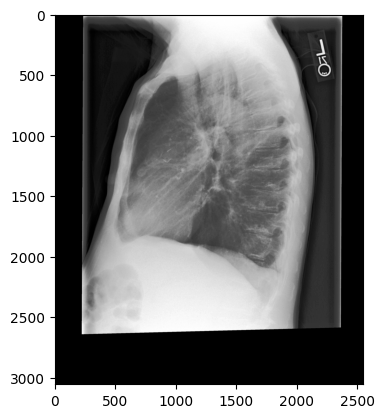

In [25]:
def make_path(s):
    subject_id = str(s.subject_id)
    study_id = str(s.study_id)
    dicom_id = str(s.dicom_id) + '.jpg'
    
    img_base_path = '/home/mimic-cxr-jpg/2.0.0/files/'
    dir_lv1 = 'p' + subject_id[:2]
    dir_lv2 = 'p' + subject_id
    dir_lv3 = 's' + study_id

    return os.path.join(img_base_path, dir_lv1, dir_lv2, dir_lv3, dicom_id)

# chexpert_train_df.iloc[1, :].apply(make_path)
img = Image.open(make_path(chexpert_train_df.iloc[1, :]))
plt.imshow(img, cmap='gray')

chexpert_train_df.apply(make_path, axis=1)

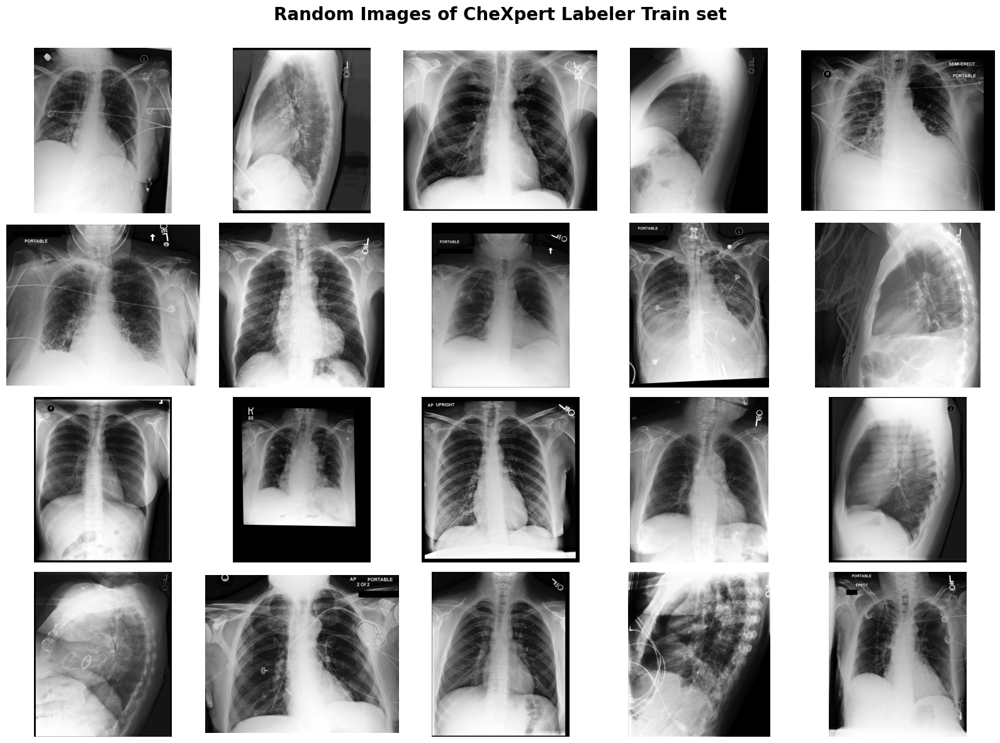

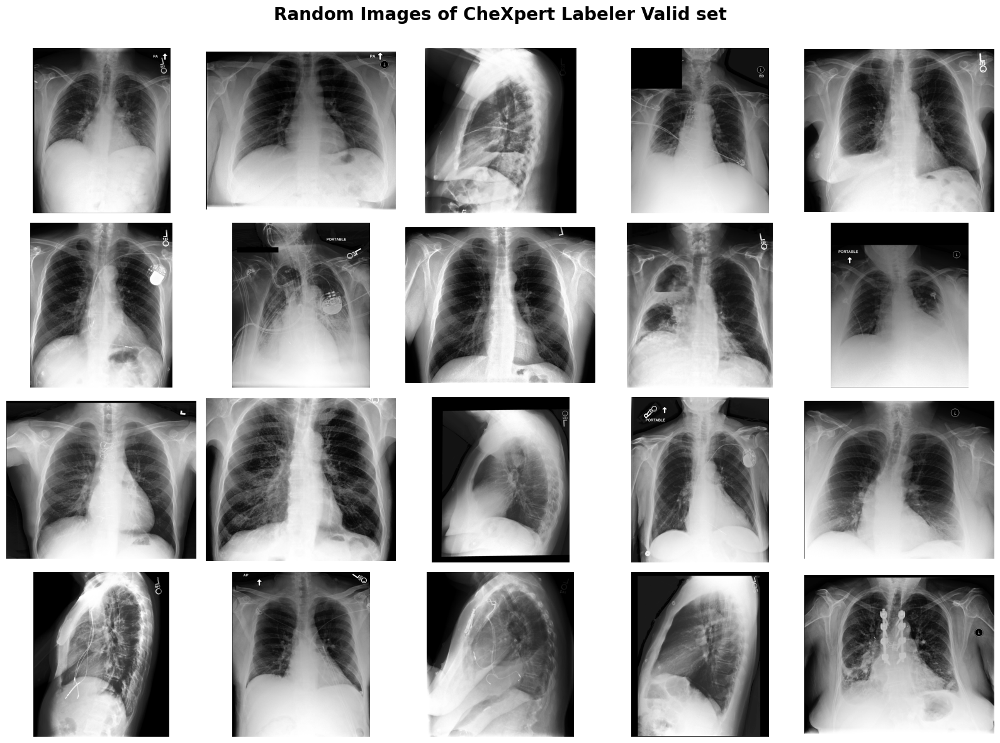

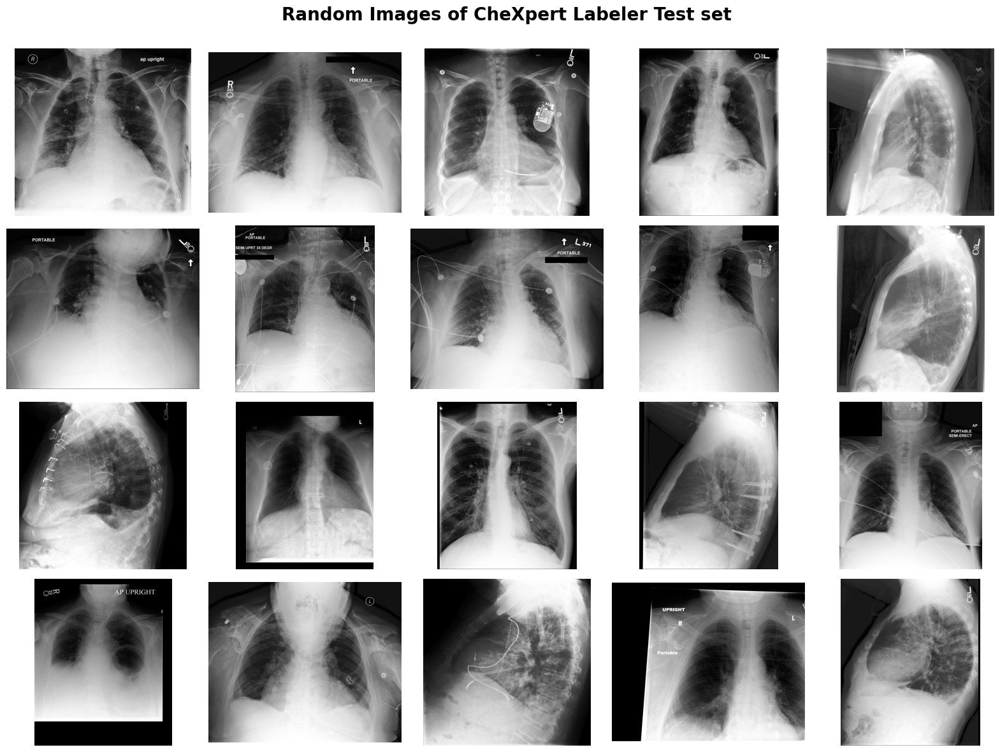

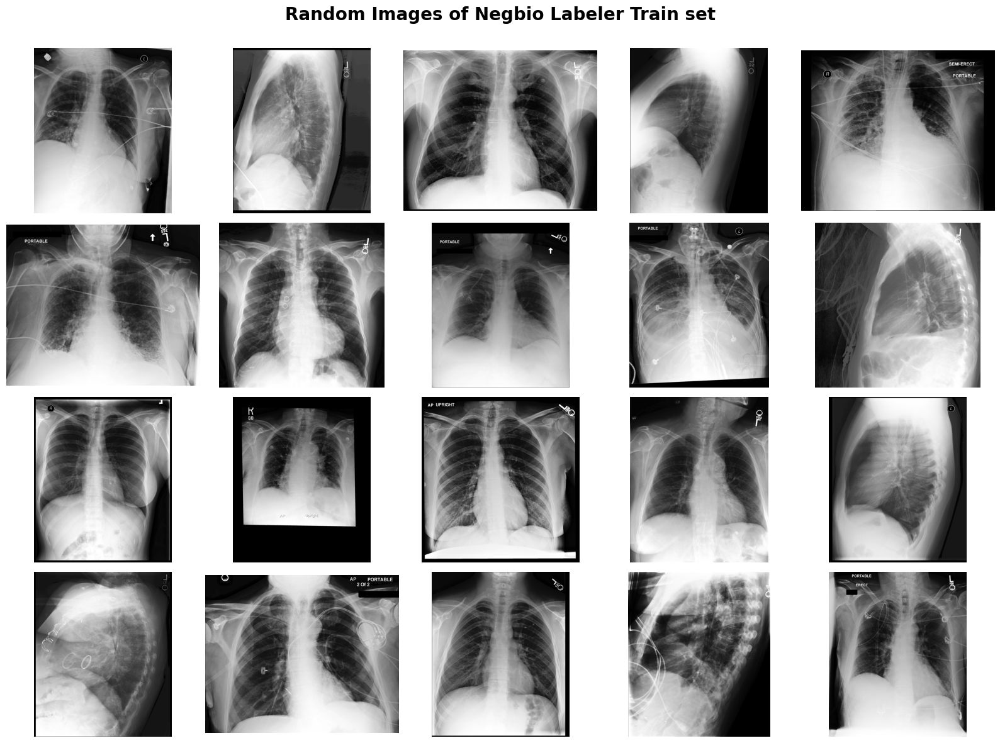

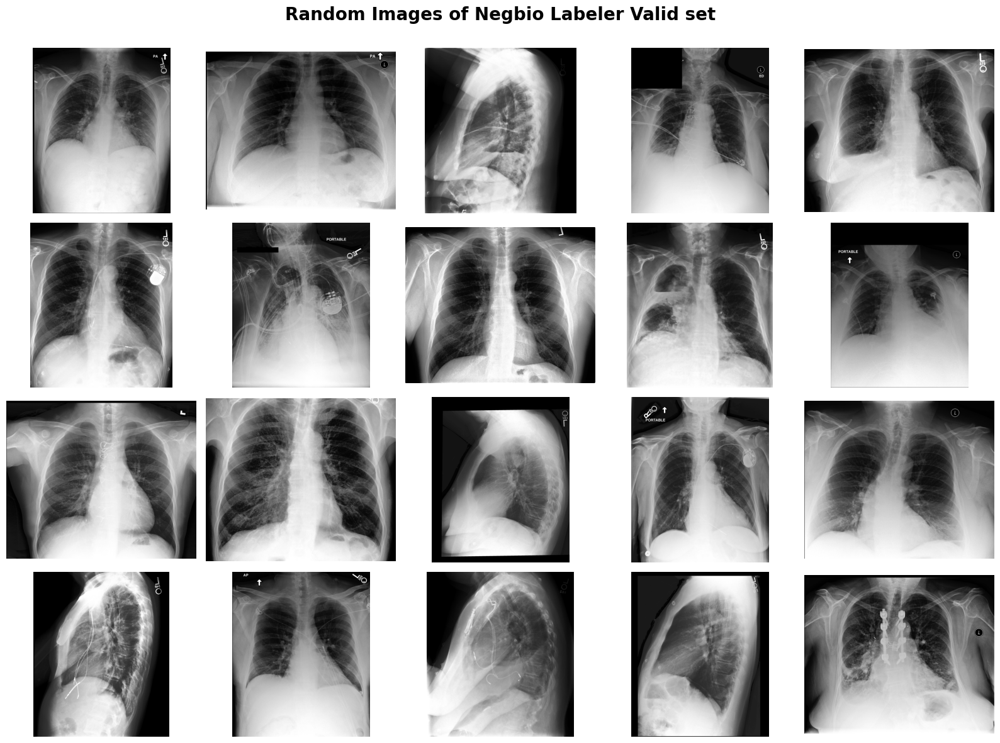

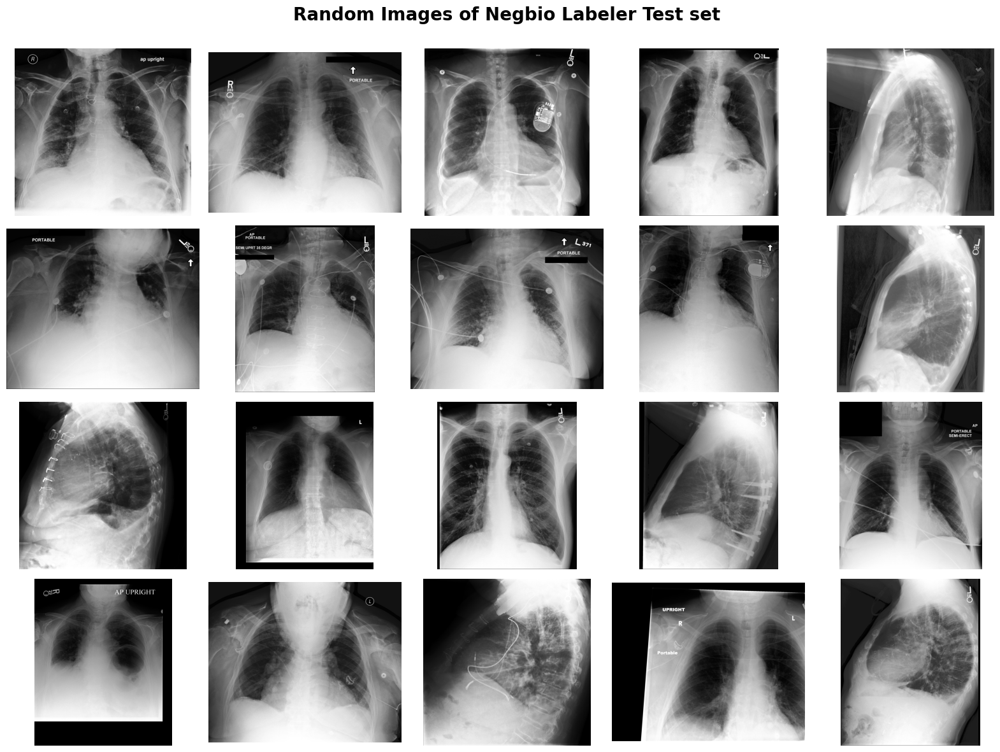

In [26]:
def plot_random_images(root_path, df_input, title=None, view_point=None, random_state=42):
    # Make path
    df = df_input.copy()
    df['Path'] = df.apply(make_path, axis=1)

    fig, axes = plt.subplots(4, 5, figsize=(16, 12))

    axes = axes.flatten()
    if view_point:
        df_w_vp = df[df['Frontal/Lateral']==view_point]
        img_paths = df_w_vp.Path.sample(20, random_state=random_state).values
    else:
        img_paths = df.Path.sample(20, random_state=random_state).values

    for idx, ax in enumerate(axes):
        try:
            img = Image.open(os.path.join(root_path, img_paths[idx]))
        except:
            img = Image.open(os.path.join(root_path, 'CheXpert', img_paths[idx]))
        ax.imshow(img, cmap='gray')
        ax.axis(False)

    fig.suptitle(title, fontsize=20, weight='bold')
    fig.tight_layout()

# Plot random images
dfs = [chexpert_train_df, chexpert_valid_df, chexpert_test_df, negbio_train_df, negbio_valid_df, negbio_test_df]
titles = [
    'Random Images of CheXpert Labeler Train set\n',
    'Random Images of CheXpert Labeler Valid set\n',
    'Random Images of CheXpert Labeler Test set\n',
    'Random Images of Negbio Labeler Train set\n',
    'Random Images of Negbio Labeler Valid set\n',
    'Random Images of Negbio Labeler Test set\n',
]

for df, title in zip(dfs, titles):
    plot_random_images(root_dir, df, title)

### 2.2 View position check by random sampling

In [27]:
chexpert_df['Frontal/Lateral']

0         FRONTAL
1         LATERAL
2         FRONTAL
3         LATERAL
4         FRONTAL
           ...   
377090    FRONTAL
377091    LATERAL
377092    FRONTAL
377093    FRONTAL
377094    FRONTAL
Name: Frontal/Lateral, Length: 377095, dtype: object

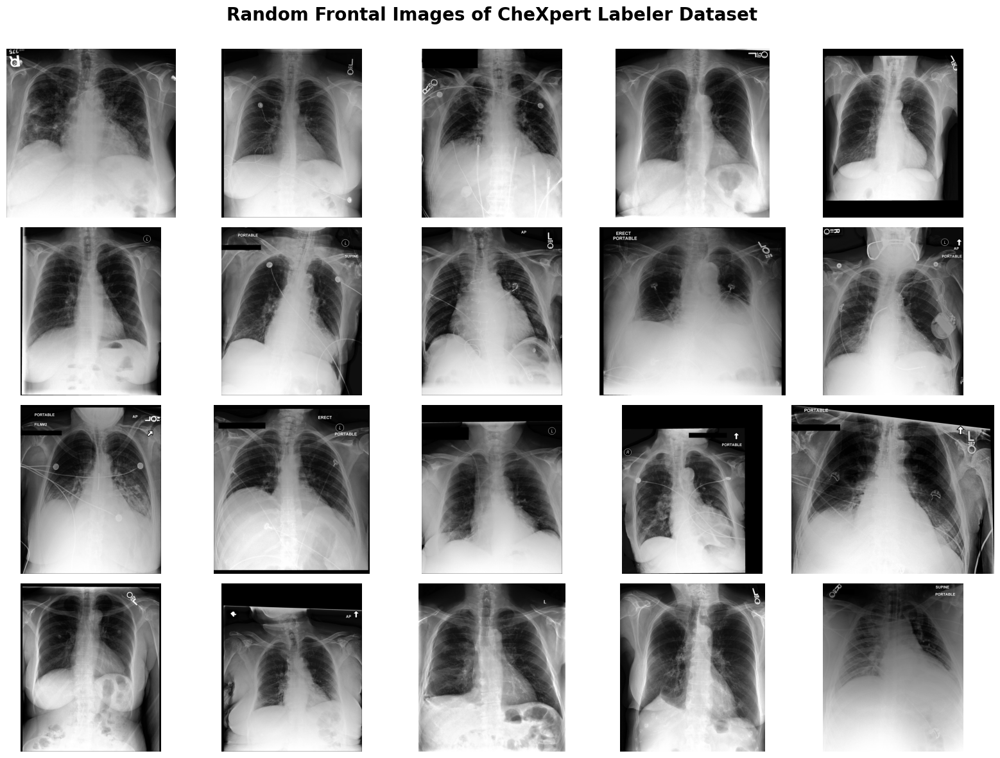

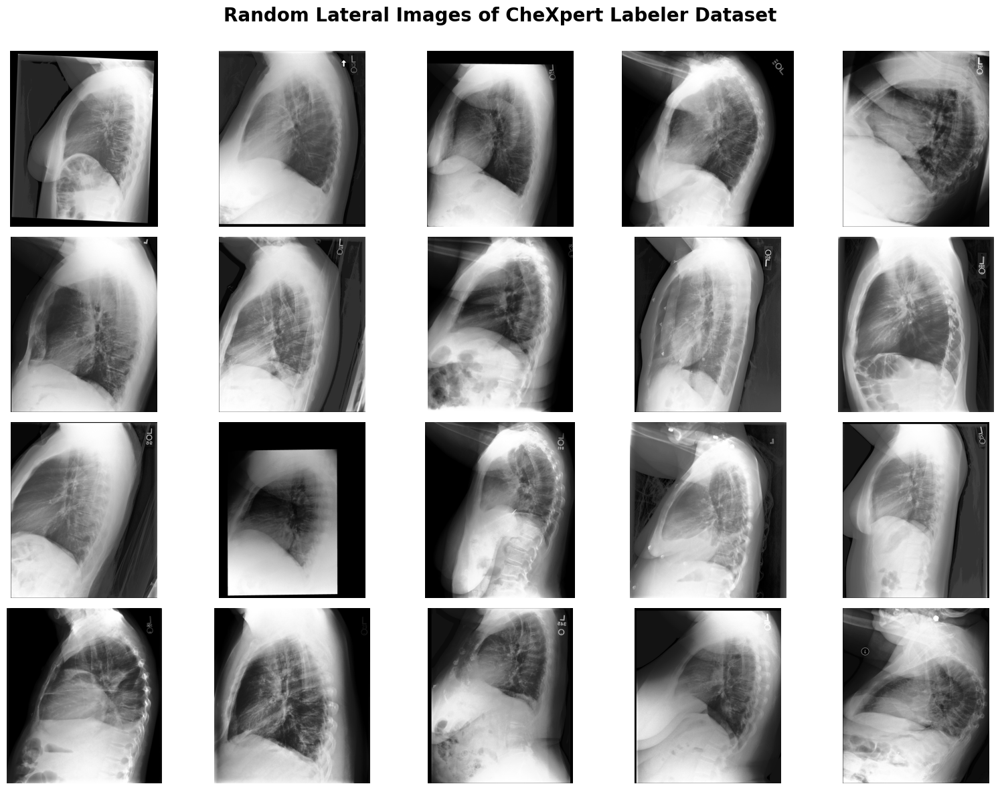

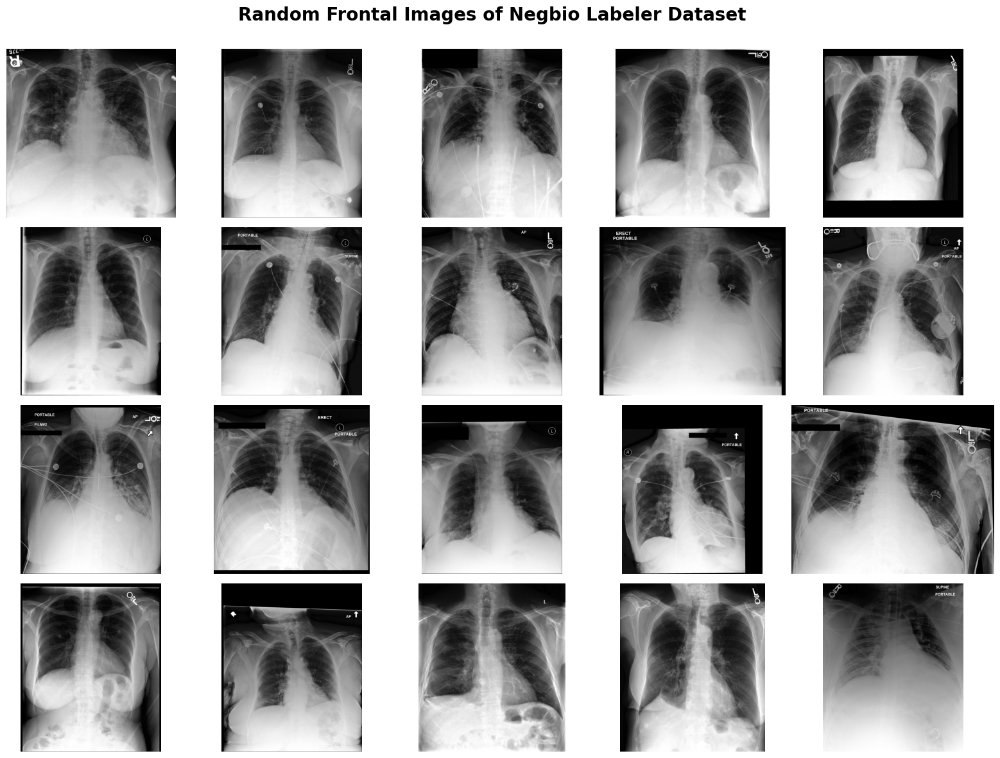

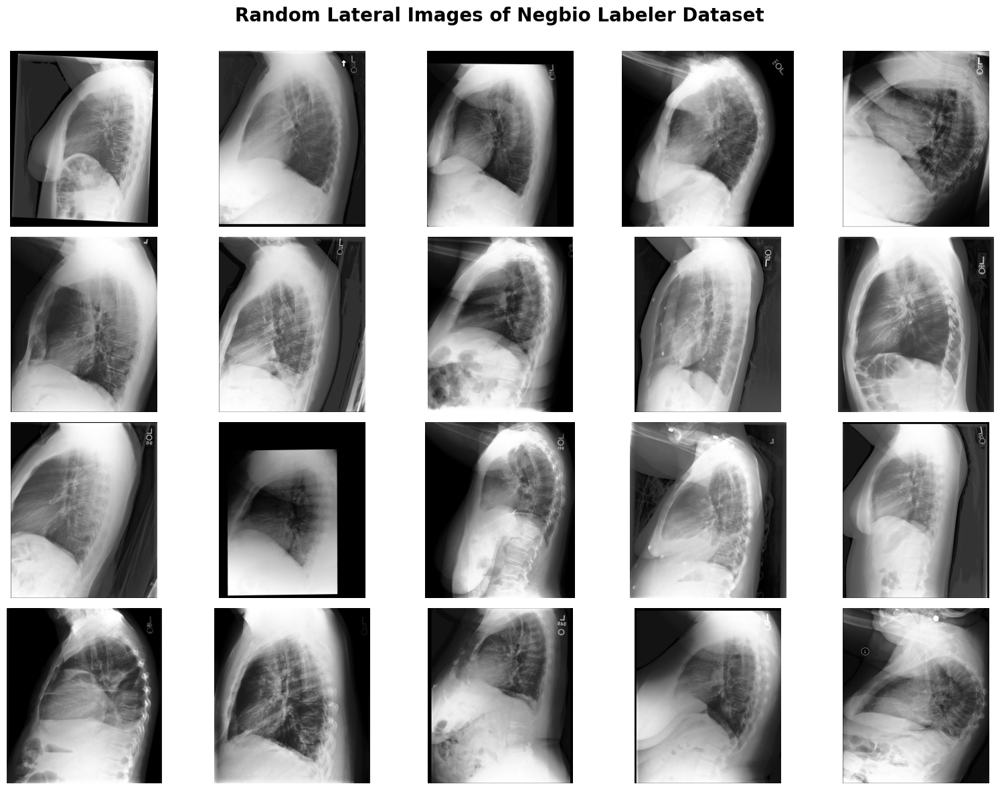

In [28]:
dfs = [
    chexpert_df, chexpert_df, negbio_df, negbio_df,
]

titles = [
    'Random Frontal Images of CheXpert Labeler Dataset\n',
    'Random Lateral Images of CheXpert Labeler Dataset\n',
    'Random Frontal Images of Negbio Labeler Dataset\n',
    'Random Lateral Images of Negbio Labeler Dataset\n',
]

view_positions = ['FRONTAL', 'LATERAL', 'FRONTAL', 'LATERAL']

for df, title, view in zip(dfs, titles, view_positions):
    plot_random_images(root_dir, df, title, view)